In [179]:
#Importing Packages
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

pd.options.mode.chained_assignment = None


In [180]:
#Importing Data
df = pd.read_csv(r'C:\Users\james\Downloads\movies.csv')

In [181]:
#Showing Data
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [182]:
#Checking for Null Values
print('Null values:', df.isnull().sum().max())
print('\nPercentage of Null Values: ')
for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, pct_missing))

Null values: 2171

Percentage of Null Values: 
name - 0.0%
rating - 0.010041731872717789%
genre - 0.0%
year - 0.0%
released - 0.0002608242044861763%
score - 0.0003912363067292645%
votes - 0.0003912363067292645%
director - 0.0%
writer - 0.0003912363067292645%
star - 0.00013041210224308815%
country - 0.0003912363067292645%
budget - 0.2831246739697444%
gross - 0.02464788732394366%
company - 0.002217005738132499%
runtime - 0.0005216484089723526%


In [183]:
#Removing 2,171 Null Values
df = df.dropna()
print('Null values:', df.isnull().sum().max())

Null values: 0


In [184]:
#Showing the Data Types
df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [185]:
#Cleaning [Votes], [Budget], [Gross] and [Runtime] Columns to Int
df['votes'] = df['votes'].astype('int64')
df['budget'] = df['budget'].astype('int64')
df['gross'] = df['gross'].astype('int64')
df['runtime'] = df['runtime'].astype('int64')

In [186]:
#Showing the reformatted columns
df.iloc[:,[6,11,12,14]]

,votes,budget,gross,runtime
0,927000,19000000,46998772,146
1,65000,4500000,58853106,104
2,1200000,18000000,538375067,124
3,221000,3500000,83453539,88
4,108000,6000000,39846344,98
5,123000,550000,39754601,95
6,188000,27000000,115229890,133
7,330000,18000000,23402427,129
8,101000,54000000,108185706,127
9,10000,10000000,15795189,100


In [187]:
df['release_date'] = df['released'].str.split('(', expand=True)[0]
df['release_date']= df['release_date'].str.replace(',','')

In [188]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,release_date
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146,June 13 1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104,July 2 1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124,June 20 1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88,July 2 1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98,July 25 1980


In [189]:
#As [Year] is inaccurate, we extract and reformat it from released
released_df = df['released'].str.split(' ',n = 3,expand = True)
released_df.rename(columns={0: 'month', 1: 'day', 2: 'year', 3: 'country'}, inplace = True)

# Add new columns to df
df['released_year'] = released_df['year']
df['released_month'] = released_df['month']
df['released_day'] = released_df['day'].str.replace(',','')

# 'released_year' will replace 'year'
df.drop(['year'], axis = 1, inplace = True)

df.head()

,name,rating,genre,released,score,votes,director,writer,star,country,budget,gross,company,runtime,release_date,released_year,released_month,released_day
0,The Shining,R,Drama,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146,June 13 1980,1980,June,13
1,The Blue Lagoon,R,Adventure,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104,July 2 1980,1980,July,2
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124,June 20 1980,1980,June,20
3,Airplane!,PG,Comedy,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88,July 2 1980,1980,July,2
4,Caddyshack,R,Comedy,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98,July 25 1980,1980,July,25


In [190]:
#Sorting Based on Gross Revenue
df.sort_values(by=['gross'], inplace=False, ascending=False)

,name,rating,genre,released,score,votes,director,writer,star,country,budget,gross,company,runtime,release_date,released_year,released_month,released_day
5445,Avatar,PG-13,Action,"December 18, 2009 (United States)",7.8,1100000,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162,December 18 2009,2009,December,18
7445,Avengers: Endgame,PG-13,Action,"April 26, 2019 (United States)",8.4,903000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181,April 26 2019,2019,April,26
3045,Titanic,PG-13,Drama,"December 19, 1997 (United States)",7.8,1100000,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194,December 19 1997,1997,December,19
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,"December 18, 2015 (United States)",7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138,December 18 2015,2015,December,18
7244,Avengers: Infinity War,PG-13,Action,"April 27, 2018 (United States)",8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149,April 27 2018,2018,April,27
7480,The Lion King,PG,Animation,"July 19, 2019 (United States)",6.9,222000,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118,July 19 2019,2019,July,19
6653,Jurassic World,PG-13,Action,"June 12, 2015 (United States)",7.0,593000,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124,June 12 2015,2015,June,12
6043,The Avengers,PG-13,Action,"May 4, 2012 (United States)",8.0,1300000,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143,May 4 2012,2012,May,4
6646,Furious 7,PG-13,Action,"April 3, 2015 (United States)",7.1,370000,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137,April 3 2015,2015,April,3
7494,Frozen II,PG,Animation,"November 22, 2019 (United States)",6.8,148000,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103,November 22 2019,2019,November,22


Text(0.5, 1.08, 'Quantitative Variable Relationships')

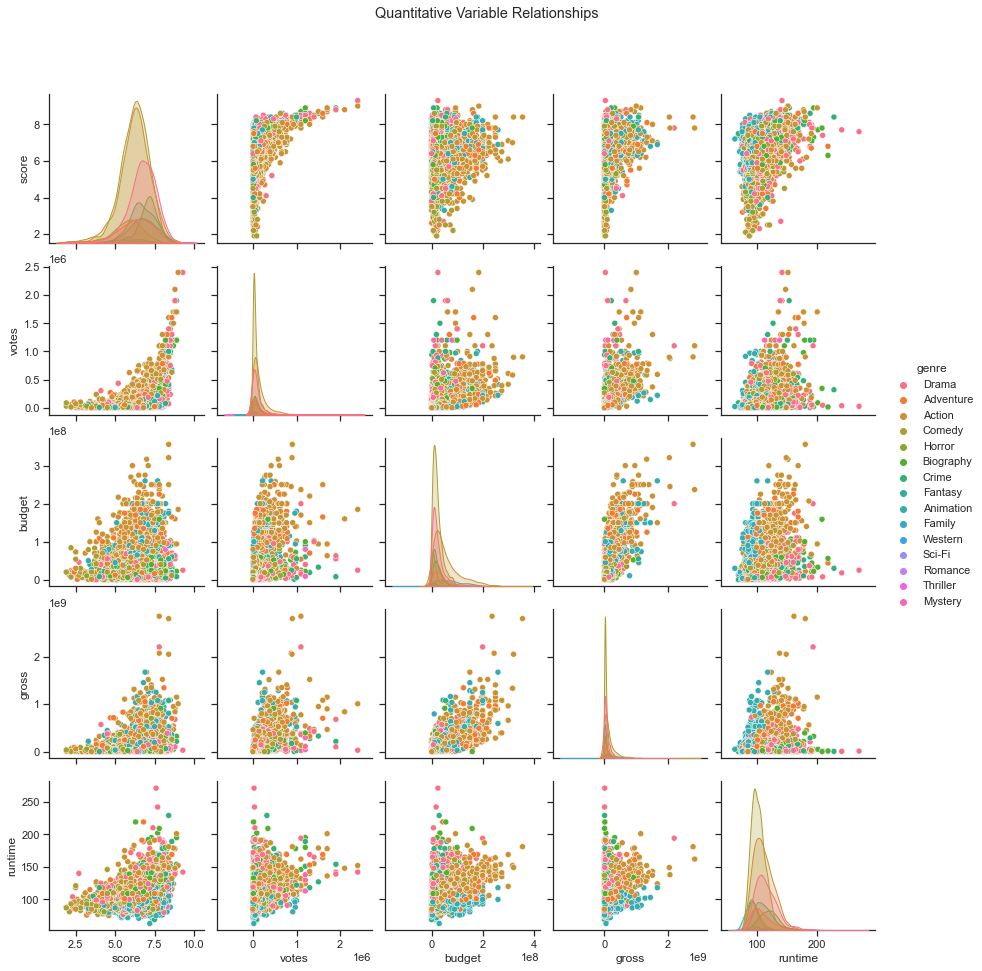

In [191]:
import seaborn as sns
sns.set_theme(style="ticks")

g = sns.pairplot(df, hue="genre")

g.fig.suptitle("Quantitative Variable Relationships", y=1.08)

[Text(0.5, 1.0, 'Gross Revenue vs. Budget, Sized by Score')]

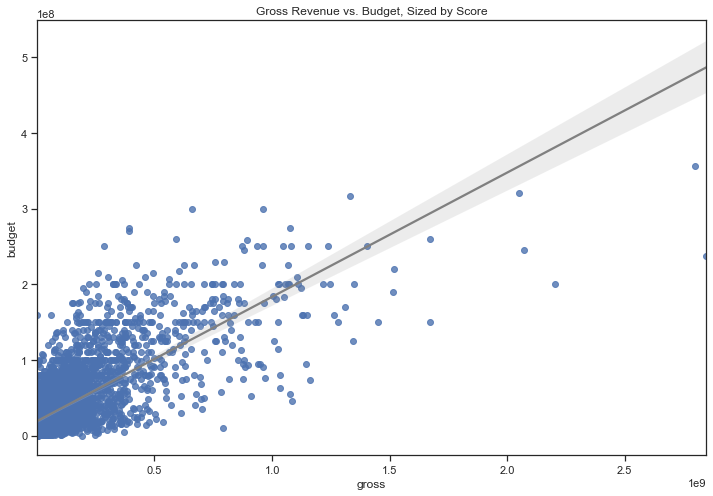

In [192]:
sns.regplot(x="gross", y="budget", 
            data=df, line_kws={"color":"grey"}).set(title='Gross Revenue vs. Budget, Sized by Score')

Text(84.453125, 0.5, 'Movie Features')

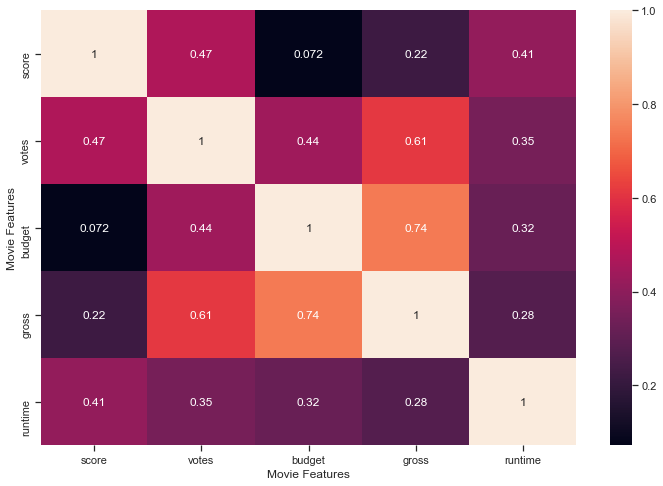

In [193]:
#Investigating the Correlation with standard data
Corr_Mat = df.corr(method='pearson')
fig, ax = plt.subplots()
sns.heatmap(Corr_Mat, annot=True, ax=ax)

plt.xlabel("Movie Features")
plt.ylabel("Movie Features")

In [194]:
#Converting Categorical Columns to Numerical
df_numerised = df.copy()
df_numerised.drop(['released', 'released_year', 'released_month', 'released_day'], axis=1, inplace=True)

for col_name in df_numerised.columns:
    if(df_numerised[col_name].dtype == 'object'):
        df_numerised[col_name] = df_numerised[col_name].astype('category')
        df_numerised[col_name] = df_numerised[col_name].cat.codes
        
df_numerised

,name,rating,genre,score,votes,director,writer,star,country,budget,gross,company,runtime,release_date
0,4692,6,6,8.4,927000,1795,2832,699,46,19000000,46998772,1426,146,1239
1,3929,6,1,5.8,65000,1578,1158,214,47,4500000,58853106,452,104,1065
2,3641,4,0,8.7,1200000,757,1818,1157,47,18000000,538375067,945,124,1288
3,204,4,4,7.7,221000,889,1413,1474,47,3500000,83453539,1108,88,1065
4,732,6,4,7.3,108000,719,351,271,47,6000000,39846344,1083,98,1108
5,1509,6,9,6.4,123000,1758,3081,155,47,550000,39754601,1108,95,1814
6,3930,6,0,7.9,188000,974,576,860,47,27000000,115229890,1397,133,1288
7,3122,6,3,8.2,330000,1269,1257,1469,47,18000000,23402427,390,129,499
8,3732,4,0,6.8,101000,1606,1402,595,47,54000000,108185706,548,127,1276
9,4401,6,3,7.0,10000,2011,280,402,47,10000000,15795189,1391,100,1657


In [195]:
df.head()

,name,rating,genre,released,score,votes,director,writer,star,country,budget,gross,company,runtime,release_date,released_year,released_month,released_day
0,The Shining,R,Drama,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146,June 13 1980,1980,June,13
1,The Blue Lagoon,R,Adventure,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104,July 2 1980,1980,July,2
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124,June 20 1980,1980,June,20
3,Airplane!,PG,Comedy,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88,July 2 1980,1980,July,2
4,Caddyshack,R,Comedy,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98,July 25 1980,1980,July,25


Text(84.453125, 0.5, 'Movie Features')

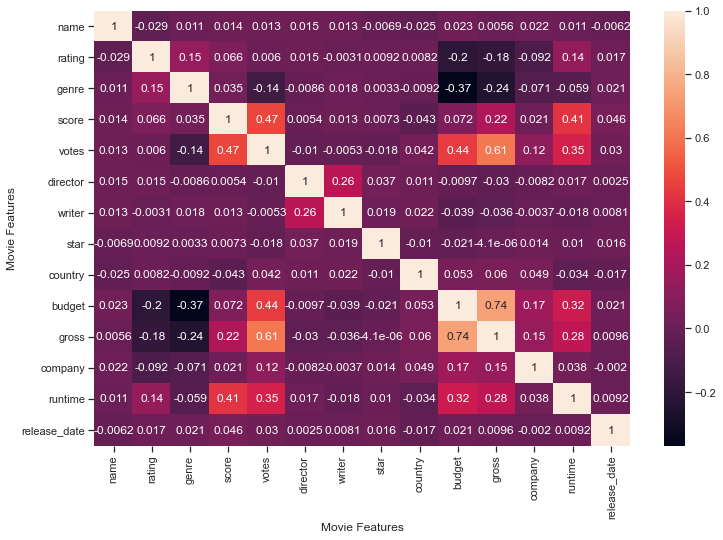

In [196]:
#Investigating the Correlation with Numerised Data
Corr_Mat = df_numerised.corr(method='pearson')
fig, ax = plt.subplots()
sns.heatmap(Corr_Mat, annot=True, ax=ax)

plt.xlabel("Movie Features")
plt.ylabel("Movie Features")

In [197]:
corr_pairs = Corr_Mat.unstack()

sorted_pairs = corr_pairs.sort_values()
pd.set_option("display.max_rows", None, "display.max_columns", None)
print(sorted_pairs)

budget        genre          -0.368523
genre         budget         -0.368523
              gross          -0.244101
gross         genre          -0.244101
rating        budget         -0.203946
budget        rating         -0.203946
gross         rating         -0.181906
rating        gross          -0.181906
genre         votes          -0.135990
votes         genre          -0.135990
company       rating         -0.092357
rating        company        -0.092357
genre         company        -0.071334
company       genre          -0.071334
runtime       genre          -0.059237
genre         runtime        -0.059237
country       score          -0.043051
score         country        -0.043051
writer        budget         -0.039466
budget        writer         -0.039466
gross         writer         -0.035885
writer        gross          -0.035885
country       runtime        -0.034477
runtime       country        -0.034477
gross         director       -0.029560
director      gross      

In [202]:
#Filtering Correlations over 0.5 but less than 1.0
high_corr = sorted_pairs[(sorted_pairs) > 0.5]
high_corr = high_corr[(high_corr) < 1.0]

high_corr

votes   gross     0.614751
gross   votes     0.614751
budget  gross     0.740247
gross   budget    0.740247
dtype: float64

In [ ]:
#Votes and Budget has the highest correlation to gross earnings.